<a href="https://colab.research.google.com/github/UMassIonTrappers/quantum-computing-labs/blob/main/Lab_05a_X_vs_Y_pulses.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ECE 550/650

## Introduction to Quantum Computing

Robert Niffenegger (rniffenegger@umass.edu )


In [56]:
try:
  import qutip
except ImportError:
  print('Install Qutip')
  !pip install qutip

try:
  import qiskit
except ImportError:
  print('Install Qiskit')
  !pip install -q qiskit
  !pip install -q qiskit[visualization]
  !pip install -q git+https://github.com/qiskit-community/qiskit-textbook.git#subdirectory=qiskit-textbook-src

### Initialize

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from numpy import pi, sqrt, sin, cos
plt.style.use('default') #background can be set to 'dark_backgound'...
linewidth = 4
figsize=5
ani_figsize = 3
fs=15

from pylab import *
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML, display, Math

#QuTiP
import qutip as qt
from qutip import *
from qutip.qip import *
from qutip import qeye, tensor, destroy, fock_dm
from qutip.qip.circuit import Gate
from qutip.qip.operations import *
from qutip.measurement import measure, measurement_statistics

#QISKIT
from qiskit import QuantumCircuit, transpile, assemble
from qiskit.visualization import plot_bloch_multivector, plot_histogram
from qiskit.quantum_info import Statevector
from qiskit_aer import QasmSimulator

#Future add: https://qopt.readthedocs.io/en/latest/examples/rabi_rwa.html

# Lab 5 part 1 - X vs Y pulses

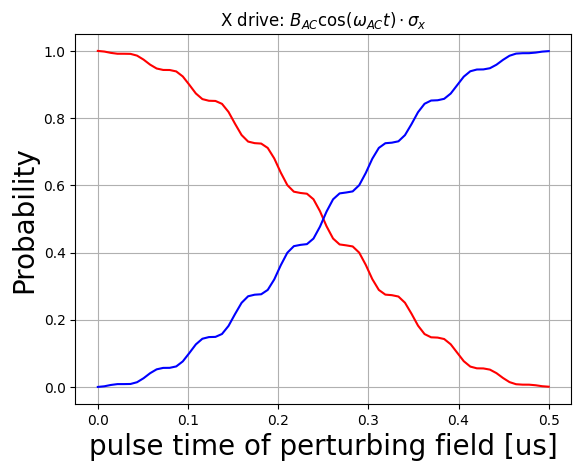

In [437]:
omega_z = 2*pi*10
Omega_Rabi = 2*pi*1

delta = 0 # Rabi coupling and detuning equal
omega_AC = omega_z + delta

psi_up = spin_state(1/2, +1/2) # Define spin up state
psi_down = spin_state(1/2, -1/2) # Define spin up state

psi0 =  psi_up #initialize state

H0 = omega_z/2 * sigmaz() #Energy of the Zeeman spin splitting

'''Time Dependent Hamiltonian from applied AC Bfield'''
def H1_coeff(t,args):
    t0=args['t0']
    return Omega_Rabi*np.cos(omega_AC*t)

'''Adding static and dynamic Hamiltonians to numerically integrate the state trajectory'''
H = [H0,[sigmax(),H1_coeff]]

times=np.linspace(0, 1*pi/Omega_Rabi, 70)
args = {"t0":1e-6}

result = mesolve(H, psi0, times, args=args)
sz =  expect(sigmaz(), result.states)
sy =  expect(sigmay(), result.states)
sx =  expect(sigmax(), result.states)


prob_up =  expect(psi_up*psi_up.dag(), result.states)#Extract the expectation values of being in each state
prob_down =  expect(psi_down*psi_down.dag(), result.states)

fig, ax = plt.subplots(1,1)
plt.grid()
ax.plot(times, prob_up,'-r')
ax.plot(times, prob_down,'-b')
plt.title(r'X drive: $B_{AC} \cos(\omega_{AC}t) \cdot \sigma_x$')
ax.set_xlabel(r'pulse time of perturbing field [us]', fontsize=20)
ax.set_ylabel(r'Probability', fontsize=20)


'''Animate on the Bloch sphere'''
fig = plt.figure(figsize=(ani_figsize,ani_figsize))
fig.suptitle(r'X drive: $B_{AC} \cos(\omega_{AC}t) \cdot \sigma_x$', fontsize=fs)
ax = fig.add_subplot(111, projection='3d') #MUST BE SUBPLOT --- WILL NOT WORK with 'Axes3d'!!!!!!

sphere = Bloch(axes=ax)

def animate(i):
    sphere.clear()
    sphere.vector_color = ['r','green','blue']

    sphere.add_points([sx[:i+1],sy[:i+1],sz[:i+1]], meth='l') #Point for each step of the rotation
    sphere.add_vectors([sx[i],sy[i],sz[i]]) #Full vector from the simulation

    sphere.add_vectors([0,-0.5*np.cos(omega_AC*times[i]),0]) #Perturbation field
    sphere.add_vectors([0,-0.1*np.cos(omega_AC*times[i]),1]) #Total rotation vector

    '''ROTATE THE ENTIRE REFERENCE FRAME AT omega_AC !!!!'''
    ax.view_init(elev=45, azim=360/(2*pi)*times[i]*omega_AC-45)  # Adjust azimuthal angle to create rotation effect

    sphere.make_sphere()
    return ax

def init():
    sphere.vector_color = ['r']
    return ax

ani = matplotlib.animation.FuncAnimation(fig, animate, np.arange(len(sx)),init_func=init, blit=False, repeat=True)
plt.close()  # Prevent display of static figure
HTML(ani.to_jshtml())

# Phase shifting drive field by $\frac{\pi}{2}$ creates a Y pulse!

### X drive: $B_{AC} \cos(\omega_{AC}t)\cdot \red{\sigma_x}$
### Y drive: $B_{AC} \cos(\omega_{AC}t + \frac{\pi}{2})\cdot \red{\sigma_x}$

#### both are $\sigma_x$!! 
#### Only a phase difference of $\frac{\pi}{2}$ to create a Y pulse!




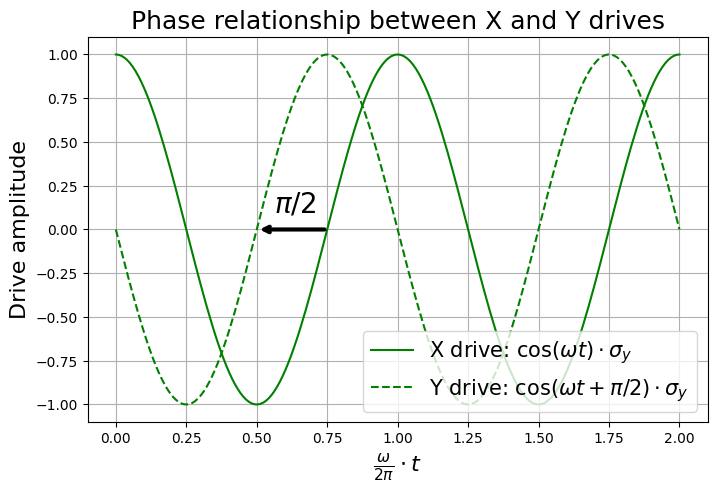

In [ ]:
# Plot two sinusoids to show phase relationship
t = np.linspace(0, 4*np.pi, 200)
x_drive = np.cos(t)
y_drive = np.cos(t + np.pi/2)

fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(t/(2*pi), x_drive, 'g-', label='X drive: $\cos(\omega t) \cdot \sigma_x$')
ax.plot(t/(2*pi), y_drive, 'g--', label='Y drive: $\cos(\omega t + \pi/2) \cdot \sigma_x$')

# Add horizontal arrow showing phase shift
arrow_x =1/2
ax.annotate('', xy=(arrow_x, 0), xytext=(arrow_x + 1/4, 0),
            arrowprops=dict(arrowstyle='->', color='k',lw=3))
ax.text(arrow_x + 0.25/4, 0.1, '$\pi/2$', fontsize=20)

ax.grid(True)
ax.set_xlabel(r'$\frac{\omega}{2\pi} \cdot t$', fontsize=16)
ax.set_ylabel('Drive amplitude', fontsize=16)
ax.legend(fontsize=15,loc='lower right')
ax.set_title('Phase relationship between X and Y drives', fontsize=18)
plt.show()

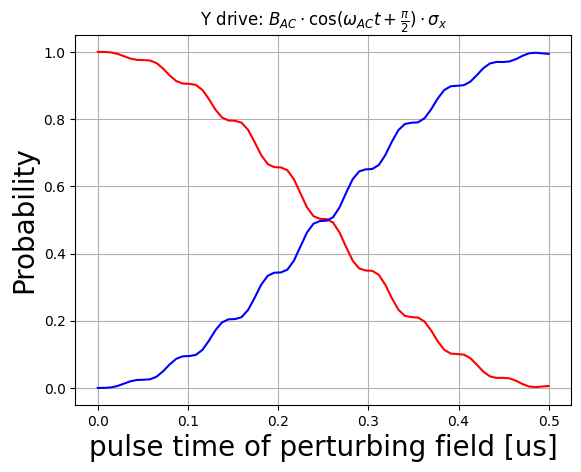

In [ ]:
omega_z = 2*pi*10
Omega_Rabi = 2*pi*1

delta = 0 # Rabi coupling and detuning equal
omega_AC = omega_z + delta

psi0 = spin_state( 1/2, +1/2) #initialize state

H0 = omega_z/2 * sigmaz() #Energy of the Zeeman spin splitting

drive_phase = pi/2
'''Time Dependent Hamiltonian from applied AC Bfield'''
def H1_coeff(t,args):
    t0=args['t0']
    return Omega_Rabi*np.cos(omega_AC*t+drive_phase)

'''Adding static and dynamic Hamiltonians to numerically integrate the state trajectory'''
H = [H0,[sigmax(),H1_coeff]]

times=np.linspace(0, 1*pi/Omega_Rabi, 70)
args = {"t0":1e-6}

result = mesolve(H, psi0, times, args=args) # run the simulation
sz =  expect(sigmaz(), result.states) # store the expectation values of sigmaz
sy =  expect(sigmay(), result.states) # store the expectation values of sigmay
sx =  expect(sigmax(), result.states) # store the expectation values of sigmax

prob_up =  expect(psi_up*psi_up.dag(), result.states) #Extract the expectation values of being in each state
prob_down =  expect(psi_down*psi_down.dag(), result.states)

fig, ax = plt.subplots(1,1)
plt.grid()
ax.plot(times, prob_up,'-r')
ax.plot(times, prob_down,'-b')
plt.title(r'Y drive: $B_{AC}\cdot \cos(\omega_{AC}t+\frac{\pi}{2}) \cdot \sigma_x$')
ax.set_xlabel(r'pulse time of perturbing field [us]', fontsize=20)
ax.set_ylabel(r'Probability', fontsize=20)


'''Animate on the Bloch sphere'''
fig = plt.figure(figsize=(ani_figsize,ani_figsize))
fig.suptitle(r'Y drive: $B_{AC} \cos(\omega_{AC}t+\frac{\pi}{2})\cdot \sigma_x$', fontsize=fs)
ax = fig.add_subplot(111, projection='3d') #MUST BE SUBPLOT --- WILL NOT WORK with 'Axes3d'!!!!!!

sphere = Bloch(axes=ax)

def animate(i):
    sphere.clear()
    sphere.vector_color = ['r','green','blue']

    sphere.add_points([sx[:i+1],sy[:i+1],sz[:i+1]], meth='l') #Point for each step of the rotation
    sphere.add_vectors([sx[i],sy[i],sz[i]]) #Full vector from the simulation

    sphere.add_vectors([0,-0.5*np.cos(omega_AC*times[i]+drive_phase),0]) #Perturbation field
    sphere.add_vectors([0,-0.1*np.cos(omega_AC*times[i]+drive_phase),1]) #Total rotation vector

    '''ROTATE THE ENTIRE REFERENCE FRAME AT omega_AC !!!!'''
    ax.view_init(elev=45, azim=360/(2*pi)*times[i]*omega_AC-45)  # Adjust azimuthal angle to create rotation effect

    sphere.make_sphere()
    return ax

def init():
    sphere.vector_color = ['r']
    return ax

ani = matplotlib.animation.FuncAnimation(fig, animate, np.arange(len(sx)),init_func=init, blit=False, repeat=True)
plt.close()  # Prevent display of static figure
HTML(ani.to_jshtml())

# Vary Drive Phase :  X, Y, -X, -Y

In [442]:
omega_z = 2*pi*10
Omega_Rabi = 2*pi*1

delta = 0 # Rabi coupling and detuning equal
omega_AC = omega_z + delta

psi0 = spin_state( 1/2, +1/2) #initialize state

H0 = omega_z/2 * sigmaz() #Energy of the Zeeman spin splitting

def Hx_coeff(t,args):
    t0=args['t0']
    return Omega_Rabi*np.cos(omega_AC*t+0)

def Hy_coeff(t,args):
    t0=args['t0']
    return Omega_Rabi*np.cos(omega_AC*t+pi/2)

def Hnx_coeff(t,args):
    t0=args['t0']
    return Omega_Rabi*np.cos(omega_AC*t+pi)

def Hny_coeff(t,args):
    t0=args['t0']
    return Omega_Rabi*np.cos(omega_AC*t+pi*3/2)  
  
args = {"t0":1e-6}

'''Adding different phase drives to Hamiltonian'''
H_x = [H0,[sigmax(),Hx_coeff]] #X! sigmax is X!
H_y = [H0,[sigmax(),Hy_coeff]] #all X!
H_nx = [H0,[sigmax(),Hnx_coeff]] # still X!
H_ny = [H0,[sigmax(),Hny_coeff]] # Only ever was in X!!!

times=np.linspace(0, 1/2*pi/Omega_Rabi, 50)

'''Run the 'simulation'''
result_x = sesolve(H_x, psi0, times, [sigmax(), sigmay(),sigmaz()],args=args)
result_y = sesolve(H_y, psi0, times, [sigmax(), sigmay(),sigmaz()],args=args)
result_nx = sesolve(H_nx, psi0, times, [sigmax(), sigmay(),sigmaz()],args=args)
result_ny = sesolve(H_ny, psi0, times, [sigmax(), sigmay(),sigmaz()],args=args)

'''Animate on the Bloch sphere'''
fig = plt.figure(figsize=(12, 5), dpi=75, constrained_layout=True)

rows=1
cols=4

gs = GridSpec(rows,cols,figure=fig)
ax_b_x = fig.add_subplot(rows,cols,1, projection='3d')
ax_b_y = fig.add_subplot(rows,cols,2, projection='3d')
ax_b_nx = fig.add_subplot(rows,cols,3, projection='3d')
ax_b_ny = fig.add_subplot(rows,cols,4, projection='3d')

# ax_drive_x = fig.add_subplot(5)
# ax_Rabi_2D.set_title("Rabi Oscillations vs. time and detuning",fontsize=fs)
# ax_Rabi_2D.set_xlabel("Pulse time [$t \cdot \Omega$]",fontsize=fs)
# ax_Rabi_2D.set_ylabel("Detuning [$\delta/\Omega$]",fontsize=fs)

# plt.subplots_adjust(wspace=0.5)  # Increase horizontal spacing
# fig.tight_layout(pad=2.0)

b_x = Bloch(axes=ax_b_x)
b_x.make_sphere() 

b_y = Bloch(axes=ax_b_y)
b_y.make_sphere() 

b_nx = Bloch(axes=ax_b_nx)
b_nx.make_sphere()

b_ny = Bloch(axes=ax_b_ny)
b_ny.make_sphere()

vector_colors = ['r','g','b']


def animate(i):

    b_x.clear()
    b_y.clear()
    b_nx.clear()
    b_ny.clear()

    b_x.vector_color = vector_colors
    b_y.vector_color = vector_colors
    b_nx.vector_color = vector_colors
    b_ny.vector_color = vector_colors

    v_elev = 60
    v_azim = 360/(2*pi)*times[i]*omega_AC #rotate the entire frame

    b_x.add_vectors([result_x.expect[0][i],result_x.expect[1][i],result_x.expect[2][i]])
    b_x.add_points([result_x.expect[0][:i+1],result_x.expect[1][:i+1],result_x.expect[2][:i+1]], meth='l')
    ax_b_x.view_init(elev=v_elev, azim=v_azim) 
    b_x.add_vectors([0,-0.5*np.cos(omega_AC*times[i]),0]) 

    b_y.add_vectors([result_y.expect[0][i],result_y.expect[1][i],result_y.expect[2][i]])
    b_y.add_points([result_y.expect[0][:i+1],result_y.expect[1][:i+1],result_y.expect[2][:i+1]], meth='l')
    ax_b_y.view_init(elev=v_elev, azim=v_azim) 
    b_y.add_vectors([0,-0.5*np.cos(omega_AC*times[i]+pi/2),0]) 

    b_nx.add_vectors([result_nx.expect[0][i],result_nx.expect[1][i],result_nx.expect[2][i]])
    b_nx.add_points([result_nx.expect[0][:i+1],result_nx.expect[1][:i+1],result_nx.expect[2][:i+1]], meth='l')
    ax_b_nx.view_init(elev=v_elev, azim=v_azim) 
    b_nx.add_vectors([0,-0.5*np.cos(omega_AC*times[i]+pi),0]) 

    b_ny.add_vectors([result_ny.expect[0][i],result_ny.expect[1][i],result_ny.expect[2][i]])
    b_ny.add_points([result_ny.expect[0][:i+1],result_ny.expect[1][:i+1],result_ny.expect[2][:i+1]], meth='l')
    ax_b_ny.view_init(elev=v_elev, azim=v_azim)
    b_ny.add_vectors([0,-0.5*np.cos(omega_AC*times[i]+pi*3/2),0]) 

    b_x.make_sphere()
    b_y.make_sphere()
    b_nx.make_sphere()
    b_ny.make_sphere()

    ax_b_x.set_title('X: $\phi = 0$',fontsize=fs*1.2)
    ax_b_y.set_title('Y: $\phi = \pi/2$',fontsize=fs*1.2)
    ax_b_nx.set_title('-X: $\phi = \pi$',fontsize=fs*1.2)
    ax_b_ny.set_title('-Y: $\phi = 3\pi/2$',fontsize=fs*1.2)

    return ax

def init():
    b_x.make_sphere()
    b_y.make_sphere()
    b_nx.make_sphere()
    b_ny.make_sphere()
    return ax

ani = matplotlib.animation.FuncAnimation(fig, animate, np.arange(len(times)),init_func=init, blit=False, repeat=True)
plt.close()  # Prevent display of static figure
HTML(ani.to_jshtml())


In [443]:
# To save the animation using Pillow as a gif
writer = matplotlib.animation.PillowWriter(fps=10,metadata=dict(artist='Robert Niffenegger'),bitrate=1800)
ani.save('RWA_with_drive_phase_X_vs_Y.gif', writer=writer)